# **Using GANs to generate handwritten digits**

In [1]:
import os

In [2]:
# if not os.path.exists('Facewap-Deepfake-Pytorch'):
#     !wget -q https://www.dropbox.com/s/5ji7jl7httso9ny/person_images.zip
#     !wget -q https://raw.githubusercontent.com/sizhky/deep-fake-util/main/random_warp.py
#     ! unzip -q person_images.zip

In [3]:
! pip install -q jsonlines

In [4]:
! pip install -q torch_snippets torch_summary
from torch_snippets import *
from random_warp import get_training_data

Define the face cascade, which draws a bounding box around the face in an
image. 

> **Note:** This file return empty through cv2. So we downloaded file manually and uploaded in the directory

In [5]:
# face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
# face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [6]:
face_cascade.empty()

False

Define a function (crop_face) for cropping faces from an image:

In [7]:
def crop_face(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    if (len(faces) > 0):
        for (x, y, w, h) in faces:
            img2 = img[y:(y+h), x:(x+w),:]
        img2 = cv2.resize(img2, (256, 256))
        return img2, True
    else:
        return img, False

> In the preceding function, we are passing the grayscaled image (gray)
through face cascade and cropping the rectangle that contains the face.
Next, we are returning a re-sized image (img2). Further, to account for a
scenario where there is no face detected in the image, we are passing a flag
to show whether a face is detected.

Crop the images of personA and personB and place them in separate
folders:

In [8]:
!mkdir cropped_faces_personA
!mkdir cropped_faces_personB

mkdir: cannot create directory ‘cropped_faces_personA’: File exists
mkdir: cannot create directory ‘cropped_faces_personB’: File exists


In [9]:
def crop_images(folder):
    images = Glob(folder+'/*.jpg')
    for i in range(len(images)):
        img = read(images[i],1)
        img2, face_detected = crop_face(img)
        if(face_detected==False):
            continue
        else:
            cv2.imwrite('cropped_faces_'+folder+'/'+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))

In [10]:
crop_images('personA')
crop_images('personB')

Create a dataloader and inspect the data:

In [11]:
# TODO: Create a dataloader and inspect the data:
class ImageDataset(Dataset):
    def __init__(self, item_A, item_B):
        # built-in-function: read(f_name, mode) just simply convert BGR to RGB if mode = 1
        self.item_A = np.concatenate([read(f, 1)[None] for f in item_A]) / 255
        self.item_B = np.concatenate([read(f, 1)[None] for f in item_B]) / 255

        self.item_A += self.item_B.mean(axis=(0, 1, 2)) - self.item_A.mean(axis=(0, 1, 2))

    def __len__(self):
        return min(len(self.item_A), len(self.item_B))

    def __getitem__(self, idx):
        a, b = choose(self.item_A), choose(self.item_B)
        return a, b

    def collate_fn(self, batch):
        imsA, imsB = list(zip(*batch))
        imsA, targetA = get_training_data(imsA, len(imsA))
        imsB, targetB = get_training_data(imsB, len(imsB))
        imsA, imsB, targetA, targetB = [torch.Tensor(i).permute(0, 3, 1, 2).to(device) for i in [imsA, imsB, targetA, targetB]]
        return imsA, imsB, targetA, targetB

In [12]:
a = ImageDataset(Glob('cropped_faces_personA'), Glob('cropped_faces_personB'))
x = DataLoader(a, batch_size=32, collate_fn=a.collate_fn)

> The dataloader is returning four tensors, `imsA, imsB, targetA, and targetB`. The first tensor `(imsA)` is a **distorted (warped) version** of the third
tensor `(targetA)` and the second `(imsB)` is a distorted `(warped)` version of the fourth tensor `(targetB).`

> Also, as you can see in the line 
`a=ImageDataset(Glob('cropped_faces_personA'),
Glob('cropped_faces_personB'))`, we have two folders of images, one
for each person. There is no relation between any of the faces, and in
the` __iteritems__` dataset, we are randomly fetching two faces every
time.

> The key function in this step is `get_training_data`, present
in **`collate_fn`**. This is an augmentation function for warping (distorting)
faces. We are giving distorted faces as input to the autoencoder and trying
to predict regular faces

**_ProTips_: *The advantage of warping is that not only does it increase our
training data size but also acts as a regularizer to the network, which
is forced to understand key facial features despite being given a
distorted face.***

Let's inspect a few images:

In [13]:
inspect(*next(iter(x)))

Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: -0.009	Max: 0.882	Mean: 0.512	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: 0.029	Max: 0.932	Mean: 0.482	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: -0.007	Max: 0.882	Mean: 0.512	dtype: torch.float32
Tensor	Shape: torch.Size([32, 3, 64, 64])	Min: 0.029	Max: 0.934	Mean: 0.483	dtype: torch.float32


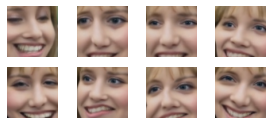

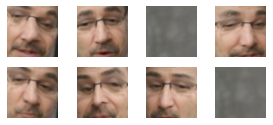

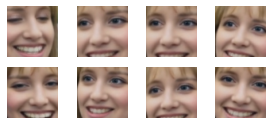

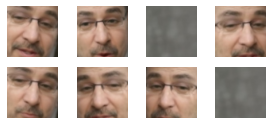

In [14]:
for i in next(iter(x)):
    subplots(i[:8], nc=4, figsize=(4,2))
    

> Note that the **input images are warped**, while the **output images are not**, and the input to output images now have a one-to-one correspondence.

*TODO: Let's inspect a few images:*

In [15]:
def _ConvLayer(input_features, output_features):
    return nn.Sequential(
        nn.Conv2d(input_features, output_features, kernel_size=5, stride=2, padding=2),
        nn.LeakyReLU(0.1, inplace=True)
    )


def _UpScale(input_features, output_features):
    return nn.Sequential(
        nn.ConvTranspose2d(input_features, output_features, kernel_size=2, stride=2, padding=0),
        nn.LeakyReLU(0.1, inplace=True)
    )


class Reshape(nn.Module):
    def forward(self, input):
        output = input.view(-1, 1024, 4, 4)  # channel 4 * 4
        return output

In [16]:
# TODO: Define the AutoEncoder model class, which has a single encoder and two decoders (decoder_A and decoder_B):

class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()

        self.encoder = nn.Sequential(
                            _ConvLayer(3, 128),
                            _ConvLayer(128, 256),
                            _ConvLayer(256, 512),
                            _ConvLayer(512, 1024),
                            nn.Flatten(),
                            nn.Linear(1024 * 4 * 4, 1024),
                            nn.Linear(1024, 1024 * 4 * 4),
                            Reshape(),
                            _UpScale(1024, 512),

        )

        self.decoderA = nn.Sequential(
                            _UpScale(512, 256),
                            _UpScale(256, 128),
                            _UpScale(128, 64),
                            nn.Conv2d(in_channels=64, out_channels=3, kernel_size=3, padding=1),
                            nn.Sigmoid()

        )

        self.decoderB = nn.Sequential(
                            _UpScale(512, 256),
                            _UpScale(256, 128),
                            _UpScale(128, 64),
                            nn.Conv2d(in_channels=64, out_channels=3, kernel_size=3, padding=1),
                            nn.Sigmoid()
        )

    def forward(self, x, select='A'):
        if select == 'A':
            out = self.encoder(x)
            out = self.decoderA(out)
        else:
            out = self.encoder(x)
            out = self.decoderB(out)
        return out


In [17]:
from torchsummary import summary
model = AutoEncoder()
summary(model, torch.zeros(32, 3, 64, 64), 'A');

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 512, 8, 8]           --
|    └─Sequential: 2-1                   [-1, 128, 32, 32]         --
|    |    └─Conv2d: 3-1                  [-1, 128, 32, 32]         9,728
|    |    └─LeakyReLU: 3-2               [-1, 128, 32, 32]         --
|    └─Sequential: 2-2                   [-1, 256, 16, 16]         --
|    |    └─Conv2d: 3-3                  [-1, 256, 16, 16]         819,456
|    |    └─LeakyReLU: 3-4               [-1, 256, 16, 16]         --
|    └─Sequential: 2-3                   [-1, 512, 8, 8]           --
|    |    └─Conv2d: 3-5                  [-1, 512, 8, 8]           3,277,312
|    |    └─LeakyReLU: 3-6               [-1, 512, 8, 8]           --
|    └─Sequential: 2-4                   [-1, 1024, 4, 4]          --
|    |    └─Conv2d: 3-7                  [-1, 1024, 4, 4]          13,108,224
|    |    └─LeakyReLU: 3-8               [-1, 1024, 4, 4]     

# **`TODO: Define the train_batch logic:`**

In [18]:
def train_batch(model, data, criterion, optimizers):
    # Initialize optimizers
    optA, optB = optimizers

    # set gradient zero
    optA.zero_grad()
    optA.zero_grad()

    # collect the data
    imgA, imgB, targetA, targetB = data  # imgA and imgB are distorted version

    # Apply the model
    _imgA, _imgB = model(imgA, 'A'), model(imgB, 'B')

    # Calculate the loss
    lossA = criterion(_imgA, targetA)
    lossB = criterion(_imgB, targetB)

    # Did the back propagation
    lossA.backward()
    lossB.backward()

    # Update the weights
    optA.step()
    optB.step()

    return lossA.item(), lossB.item()


> What we are interested in is running `model(imgA, 'B')` (which would
return an image of class B using an input image from class A), but we do
not have a ground truth to compare it against. So instead, what we are
doing is predicting _imgA from imgA (where imgA is a distorted version of
targetA) and comparing _imgA with targetA using `nn.L1Loss`.

> **Note:** We do not need validate_batch as there is no validation dataset. We will
predict new images during training and qualitatively see the progress

# **`TODO: Create all the required components to train the model`**

In [19]:
model = AutoEncoder().to(device)
dataset = ImageDataset(Glob('cropped_faces_personA'), Glob('cropped_faces_personB'))
dataloader = DataLoader(dataset, batch_size=32, collate_fn=dataset.collate_fn)
optimizers = optim.Adam([{'params': model.encoder.parameters()}, {'params': model.decoderA.parameters()}],
                        lr=5e-5, betas=(0.5, 0.999)), \
             optim.Adam([{'params': model.encoder.parameters()}, {'params': model.decoderB.parameters()}],
                        lr=5e-5, betas=(0.5, 0.999))

criterion = nn.L1Loss()

In [20]:
type(optimizers)

tuple

# **`TODO: Train the model`**

In [21]:
device

'cuda'

In [22]:
def train_model(model, epoch = 1, dataloader = dataloader, optimizers = optimizers):
    
    n_epochs = 1000
    log = Report(n_epochs)
    !mkdir checkpoint
    for epoch in range(n_epochs):
        N = len(dataloader)
        for bx, data in enumerate(dataloader):
            lossA, lossB = train_batch(model, data, criterion, optimizers)
            log.record(epoch + (1 + bx) / N, lossA=lossA, lossB=lossB, end='/r')
        log.report_avgs(epoch + 1)

        # Save the model
        if (epoch + 1) % 50 == 0:
            state = {'model_state_dict': model.state_dict(), 
                     'epoch': epoch
                     }
            torch.save(state, './checkpoint/autoencoder.pth')

        # This code is contructing from A image to B image and vice versa
        if (epoch + 1) % 50 == 0:
            bs = 5
            a, b, A, B = data
            line('A to B')
            _a = model(a[:bs], 'A')
            _b = model(a[:bs], 'B')
            x = torch.cat([A[:bs], _a, _b])
            subplots(x, nc=bs, figsize=(bs*2, 5))

            line('B to A')
            _a = model(b[:bs], 'B')
            _b = model(a[:bs], 'A')
            x = torch.cat([B[:bs], _a, _b])
            subplots(x, nc=bs, figsize=(bs*2, 5))

    return log.plot_epochs()


mkdir: cannot create directory ‘checkpoint’: File exists
EPOCH: 1.000	lossA: 0.050	lossB: 0.036	(4.27s - 4263.02s remaining)/r
EPOCH: 2.000	lossA: 0.048	lossB: 0.032	(7.98s - 3980.19s remaining)/r
EPOCH: 3.000	lossA: 0.049	lossB: 0.036	(11.69s - 3883.99s remaining)/r
EPOCH: 4.000	lossA: 0.049	lossB: 0.037	(15.36s - 3825.70s remaining)/r
EPOCH: 5.000	lossA: 0.049	lossB: 0.038	(19.09s - 3799.60s remaining)/r
EPOCH: 6.000	lossA: 0.049	lossB: 0.038	(22.80s - 3777.91s remaining)/r
EPOCH: 7.000	lossA: 0.051	lossB: 0.038	(26.55s - 3766.32s remaining)/r
EPOCH: 8.000	lossA: 0.048	lossB: 0.035	(30.28s - 3755.17s remaining)/r
EPOCH: 9.000	lossA: 0.048	lossB: 0.034	(34.03s - 3747.08s remaining)/r
EPOCH: 10.000	lossA: 0.048	lossB: 0.036	(37.73s - 3735.00s remaining)/r
EPOCH: 11.000	lossA: 0.049	lossB: 0.037	(41.42s - 3724.34s remaining)/r
EPOCH: 12.000	lossA: 0.048	lossB: 0.037	(45.13s - 3716.00s remaining)/r
EPOCH: 13.000	lossA: 0.047	lossB: 0.035	(48.83s - 3707.22s remaining)/r
EPOCH: 14.000	loss

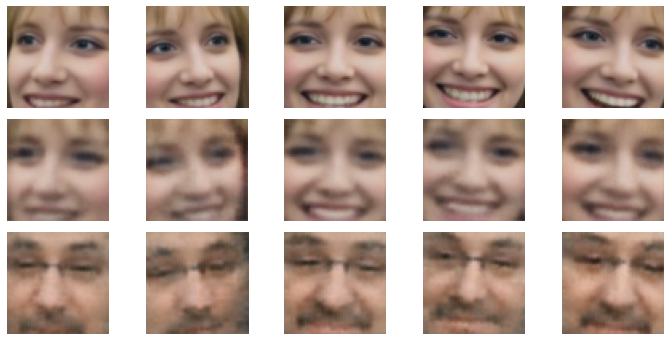

==============================B TO A==============================


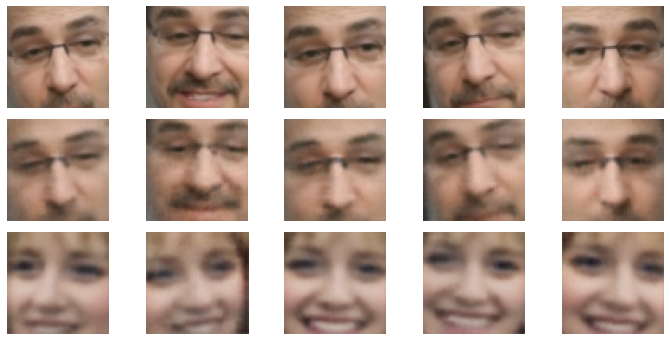

EPOCH: 101.000	lossA: 0.040	lossB: 0.029	(382.10s - 3401.04s remaining)/r
EPOCH: 102.000	lossA: 0.041	lossB: 0.031	(385.83s - 3396.78s remaining)/r
EPOCH: 103.000	lossA: 0.041	lossB: 0.030	(389.55s - 3392.48s remaining)/r
EPOCH: 104.000	lossA: 0.039	lossB: 0.031	(393.23s - 3387.85s remaining)/r
EPOCH: 105.000	lossA: 0.040	lossB: 0.027	(396.92s - 3383.28s remaining)/r
EPOCH: 106.000	lossA: 0.041	lossB: 0.029	(400.62s - 3378.83s remaining)/r
EPOCH: 106.500	lossA: 0.041	lossB: 0.031	(402.58s - 3377.52s remaining)/r

KeyboardInterrupt: 

In [27]:
# train_model(model)

> *As you can see, we can swap expressions from one face to another by tweaking an
autoencoder to have two decoders instead of one. Furthermore, with a higher number
of epochs, the reconstructed image gets more realistic*

In [23]:
def load_checkpoint(model, load_path):
    checkpoint = torch.load(load_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    # optimizer.load_state_dict(checkpoint['optimizer.state_dict'])
    epoch = checkpoint['epoch']
    return model, epoch # optimizer,

In [26]:
load_checkpoint(model, 'checkpoint/autoencoder.pth')

(AutoEncoder(
   (encoder): Sequential(
     (0): Sequential(
       (0): Conv2d(3, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
       (1): LeakyReLU(negative_slope=0.1, inplace=True)
     )
     (1): Sequential(
       (0): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
       (1): LeakyReLU(negative_slope=0.1, inplace=True)
     )
     (2): Sequential(
       (0): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
       (1): LeakyReLU(negative_slope=0.1, inplace=True)
     )
     (3): Sequential(
       (0): Conv2d(512, 1024, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
       (1): LeakyReLU(negative_slope=0.1, inplace=True)
     )
     (4): Flatten(start_dim=1, end_dim=-1)
     (5): Linear(in_features=16384, out_features=1024, bias=True)
     (6): Linear(in_features=1024, out_features=16384, bias=True)
     (7): Reshape()
     (8): Sequential(
       (0): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
       (1)

mkdir: cannot create directory ‘checkpoint’: File exists
EPOCH: 1.000	lossA: 0.066	lossB: 0.055	(4.23s - 4223.65s remaining)/r
EPOCH: 2.000	lossA: 0.047	lossB: 0.039	(7.91s - 3947.67s remaining)/r
EPOCH: 3.000	lossA: 0.044	lossB: 0.032	(11.58s - 3848.13s remaining)/r
EPOCH: 4.000	lossA: 0.040	lossB: 0.030	(15.29s - 3807.14s remaining)/r
EPOCH: 5.000	lossA: 0.041	lossB: 0.030	(18.99s - 3779.27s remaining)/r
EPOCH: 6.000	lossA: 0.040	lossB: 0.029	(22.67s - 3755.08s remaining)/r
EPOCH: 7.000	lossA: 0.040	lossB: 0.028	(26.36s - 3739.01s remaining)/r
EPOCH: 8.000	lossA: 0.041	lossB: 0.028	(30.06s - 3727.41s remaining)/r
EPOCH: 9.000	lossA: 0.039	lossB: 0.028	(33.77s - 3718.64s remaining)/r
EPOCH: 10.000	lossA: 0.038	lossB: 0.028	(37.46s - 3708.84s remaining)/r
EPOCH: 11.000	lossA: 0.041	lossB: 0.029	(41.15s - 3700.00s remaining)/r
EPOCH: 12.000	lossA: 0.041	lossB: 0.028	(44.84s - 3692.24s remaining)/r
EPOCH: 13.000	lossA: 0.039	lossB: 0.029	(48.53s - 3684.41s remaining)/r
EPOCH: 14.000	loss

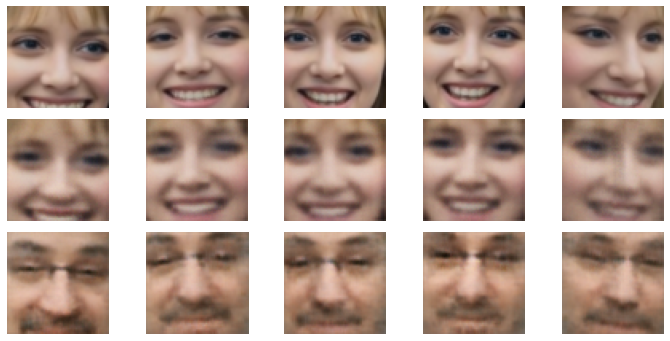

==============================B TO A==============================


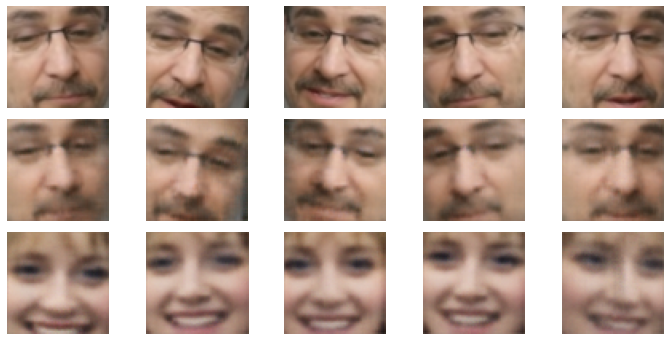

EPOCH: 51.000	lossA: 0.036	lossB: 0.027	(191.85s - 3569.99s remaining)/r
EPOCH: 52.000	lossA: 0.038	lossB: 0.028	(195.54s - 3564.92s remaining)/r
EPOCH: 53.000	lossA: 0.038	lossB: 0.028	(199.24s - 3560.01s remaining)/r
EPOCH: 54.000	lossA: 0.038	lossB: 0.026	(202.92s - 3554.84s remaining)/r
EPOCH: 55.000	lossA: 0.038	lossB: 0.027	(206.61s - 3549.89s remaining)/r
EPOCH: 56.000	lossA: 0.038	lossB: 0.029	(210.29s - 3544.96s remaining)/r
EPOCH: 57.000	lossA: 0.038	lossB: 0.027	(214.02s - 3540.72s remaining)/r
EPOCH: 58.000	lossA: 0.039	lossB: 0.028	(217.72s - 3536.13s remaining)/r
EPOCH: 59.000	lossA: 0.039	lossB: 0.028	(221.43s - 3531.61s remaining)/r
EPOCH: 60.000	lossA: 0.039	lossB: 0.028	(225.11s - 3526.77s remaining)/r
EPOCH: 61.000	lossA: 0.037	lossB: 0.027	(228.85s - 3522.84s remaining)/r
EPOCH: 62.000	lossA: 0.037	lossB: 0.026	(232.55s - 3518.21s remaining)/r
EPOCH: 63.000	lossA: 0.038	lossB: 0.027	(236.27s - 3514.04s remaining)/r
EPOCH: 64.000	lossA: 0.038	lossB: 0.027	(239.97s - 

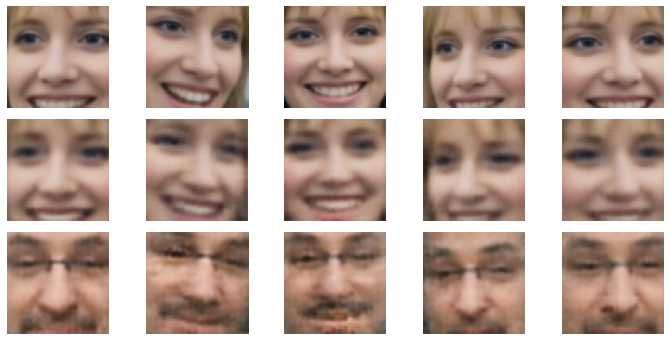

==============================B TO A==============================


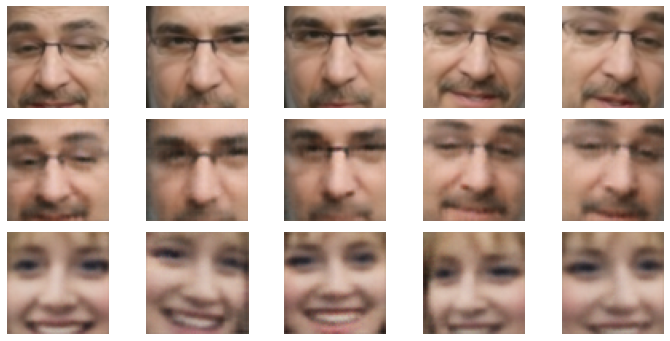

EPOCH: 101.000	lossA: 0.037	lossB: 0.026	(379.24s - 3375.59s remaining)/r
EPOCH: 102.000	lossA: 0.037	lossB: 0.027	(383.01s - 3371.95s remaining)/r
EPOCH: 103.000	lossA: 0.036	lossB: 0.026	(386.84s - 3368.89s remaining)/r
EPOCH: 104.000	lossA: 0.035	lossB: 0.026	(390.62s - 3365.32s remaining)/r
EPOCH: 105.000	lossA: 0.036	lossB: 0.027	(394.48s - 3362.50s remaining)/r
EPOCH: 106.000	lossA: 0.037	lossB: 0.024	(398.26s - 3358.89s remaining)/r
EPOCH: 107.000	lossA: 0.037	lossB: 0.027	(402.05s - 3355.41s remaining)/r
EPOCH: 108.000	lossA: 0.034	lossB: 0.024	(405.86s - 3352.13s remaining)/r
EPOCH: 109.000	lossA: 0.035	lossB: 0.026	(409.62s - 3348.37s remaining)/r
EPOCH: 110.000	lossA: 0.037	lossB: 0.026	(413.38s - 3344.63s remaining)/r
EPOCH: 111.000	lossA: 0.035	lossB: 0.027	(417.13s - 3340.79s remaining)/r
EPOCH: 112.000	lossA: 0.036	lossB: 0.026	(420.89s - 3337.07s remaining)/r
EPOCH: 113.000	lossA: 0.038	lossB: 0.027	(424.59s - 3332.87s remaining)/r
EPOCH: 114.000	lossA: 0.035	lossB: 0.0

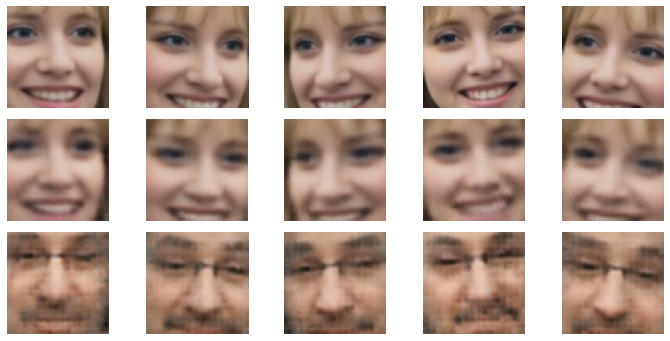

==============================B TO A==============================


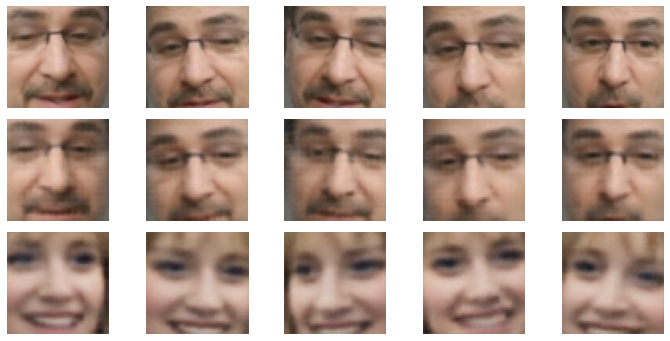

EPOCH: 151.000	lossA: 0.034	lossB: 0.025	(567.76s - 3192.22s remaining)/r
EPOCH: 152.000	lossA: 0.034	lossB: 0.026	(571.49s - 3188.34s remaining)/r
EPOCH: 153.000	lossA: 0.036	lossB: 0.026	(575.19s - 3184.24s remaining)/r
EPOCH: 154.000	lossA: 0.034	lossB: 0.025	(578.90s - 3180.19s remaining)/r
EPOCH: 155.000	lossA: 0.034	lossB: 0.026	(582.62s - 3176.20s remaining)/r
EPOCH: 156.000	lossA: 0.034	lossB: 0.026	(586.35s - 3172.31s remaining)/r
EPOCH: 157.000	lossA: 0.034	lossB: 0.024	(590.08s - 3168.42s remaining)/r
EPOCH: 158.000	lossA: 0.035	lossB: 0.025	(593.80s - 3164.43s remaining)/r
EPOCH: 159.000	lossA: 0.035	lossB: 0.026	(597.53s - 3160.53s remaining)/r
EPOCH: 160.000	lossA: 0.034	lossB: 0.025	(601.34s - 3157.05s remaining)/r
EPOCH: 161.000	lossA: 0.034	lossB: 0.027	(605.06s - 3153.07s remaining)/r
EPOCH: 162.000	lossA: 0.033	lossB: 0.026	(608.79s - 3149.16s remaining)/r
EPOCH: 163.000	lossA: 0.035	lossB: 0.027	(612.50s - 3145.18s remaining)/r
EPOCH: 164.000	lossA: 0.034	lossB: 0.0

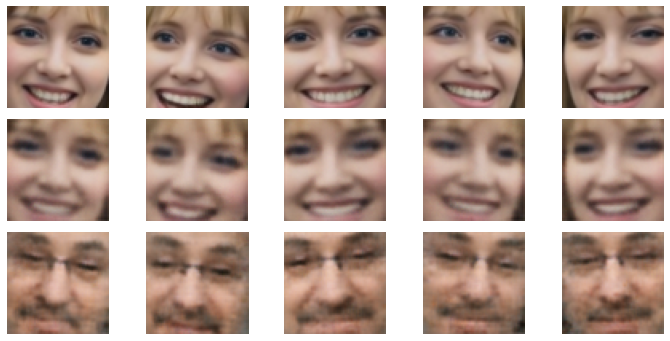

==============================B TO A==============================


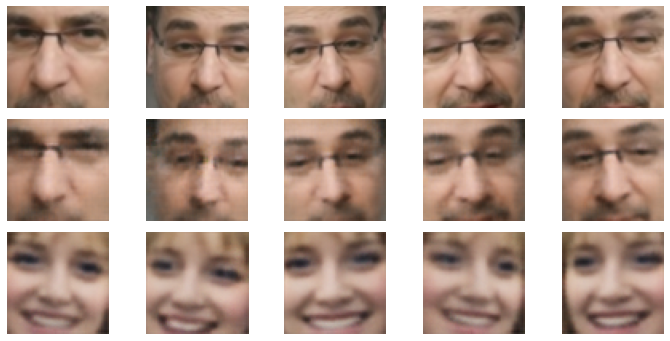

EPOCH: 201.000	lossA: 0.033	lossB: 0.025	(757.01s - 3009.20s remaining)/r
EPOCH: 202.000	lossA: 0.034	lossB: 0.026	(760.78s - 3005.44s remaining)/r
EPOCH: 203.000	lossA: 0.033	lossB: 0.023	(764.49s - 3001.49s remaining)/r
EPOCH: 204.000	lossA: 0.034	lossB: 0.025	(768.21s - 2997.52s remaining)/r
EPOCH: 205.000	lossA: 0.033	lossB: 0.025	(771.95s - 2993.65s remaining)/r
EPOCH: 206.000	lossA: 0.033	lossB: 0.024	(775.67s - 2989.73s remaining)/r
EPOCH: 207.000	lossA: 0.032	lossB: 0.025	(779.41s - 2985.86s remaining)/r
EPOCH: 208.000	lossA: 0.032	lossB: 0.024	(783.13s - 2981.93s remaining)/r
EPOCH: 209.000	lossA: 0.033	lossB: 0.025	(786.88s - 2978.08s remaining)/r
EPOCH: 210.000	lossA: 0.033	lossB: 0.025	(790.57s - 2974.07s remaining)/r
EPOCH: 211.000	lossA: 0.033	lossB: 0.023	(794.31s - 2970.17s remaining)/r
EPOCH: 212.000	lossA: 0.033	lossB: 0.025	(798.02s - 2966.21s remaining)/r
EPOCH: 213.000	lossA: 0.033	lossB: 0.026	(801.72s - 2962.21s remaining)/r
EPOCH: 214.000	lossA: 0.033	lossB: 0.0

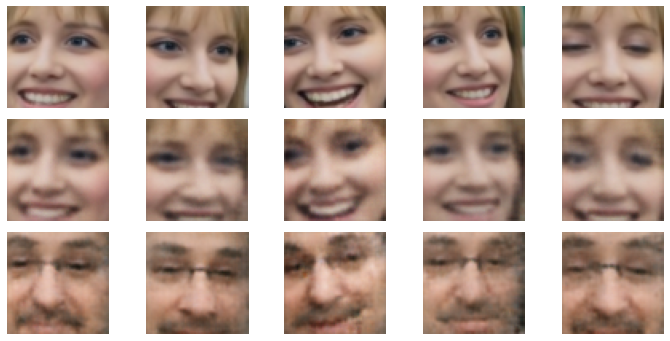

==============================B TO A==============================


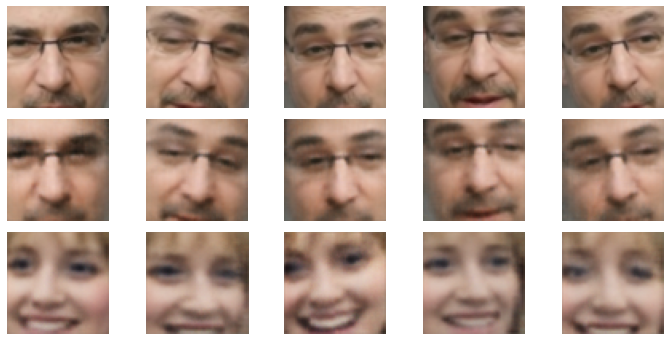

EPOCH: 251.000	lossA: 0.033	lossB: 0.023	(945.68s - 2821.98s remaining)/r
EPOCH: 252.000	lossA: 0.032	lossB: 0.025	(949.42s - 2818.12s remaining)/r
EPOCH: 253.000	lossA: 0.031	lossB: 0.023	(953.13s - 2814.19s remaining)/r
EPOCH: 254.000	lossA: 0.032	lossB: 0.024	(956.89s - 2810.39s remaining)/r
EPOCH: 255.000	lossA: 0.032	lossB: 0.024	(960.62s - 2806.52s remaining)/r
EPOCH: 256.000	lossA: 0.034	lossB: 0.024	(964.36s - 2802.68s remaining)/r
EPOCH: 257.000	lossA: 0.031	lossB: 0.025	(968.08s - 2798.76s remaining)/r
EPOCH: 258.000	lossA: 0.031	lossB: 0.023	(971.79s - 2794.84s remaining)/r
EPOCH: 259.000	lossA: 0.032	lossB: 0.024	(975.53s - 2791.00s remaining)/r
EPOCH: 260.000	lossA: 0.031	lossB: 0.023	(979.29s - 2787.20s remaining)/r
EPOCH: 261.000	lossA: 0.032	lossB: 0.024	(983.02s - 2783.34s remaining)/r
EPOCH: 262.000	lossA: 0.032	lossB: 0.025	(986.78s - 2779.54s remaining)/r
EPOCH: 263.000	lossA: 0.032	lossB: 0.023	(990.50s - 2775.65s remaining)/r
EPOCH: 264.000	lossA: 0.032	lossB: 0.0

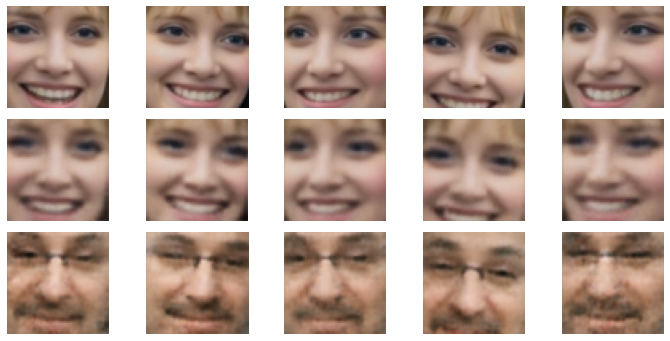

==============================B TO A==============================


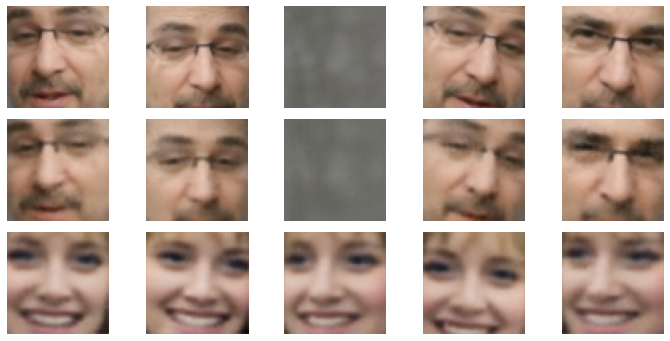

EPOCH: 301.000	lossA: 0.031	lossB: 0.022	(1134.89s - 2635.51s remaining)/r
EPOCH: 302.000	lossA: 0.032	lossB: 0.022	(1138.60s - 2631.60s remaining)/r
EPOCH: 303.000	lossA: 0.030	lossB: 0.023	(1142.31s - 2627.69s remaining)/r
EPOCH: 304.000	lossA: 0.032	lossB: 0.023	(1146.05s - 2623.85s remaining)/r
EPOCH: 305.000	lossA: 0.031	lossB: 0.024	(1149.78s - 2620.00s remaining)/r
EPOCH: 306.000	lossA: 0.031	lossB: 0.022	(1153.51s - 2616.14s remaining)/r
EPOCH: 307.000	lossA: 0.031	lossB: 0.023	(1157.24s - 2612.27s remaining)/r
EPOCH: 308.000	lossA: 0.031	lossB: 0.024	(1161.02s - 2608.53s remaining)/r
EPOCH: 309.000	lossA: 0.030	lossB: 0.022	(1164.75s - 2604.66s remaining)/r
EPOCH: 310.000	lossA: 0.032	lossB: 0.023	(1168.49s - 2600.83s remaining)/r
EPOCH: 311.000	lossA: 0.030	lossB: 0.023	(1172.23s - 2597.00s remaining)/r
EPOCH: 312.000	lossA: 0.031	lossB: 0.022	(1175.96s - 2593.15s remaining)/r
EPOCH: 313.000	lossA: 0.030	lossB: 0.022	(1179.69s - 2589.28s remaining)/r
EPOCH: 314.000	lossA: 0.0

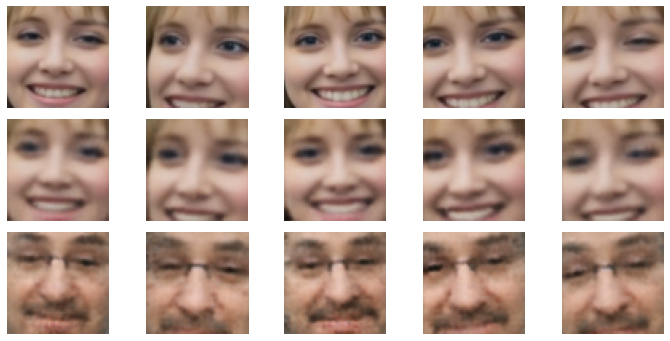

==============================B TO A==============================


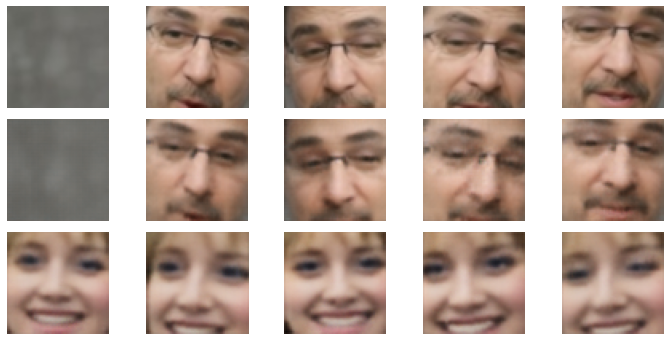

EPOCH: 351.000	lossA: 0.031	lossB: 0.021	(1323.81s - 2447.74s remaining)/r
EPOCH: 352.000	lossA: 0.031	lossB: 0.023	(1327.54s - 2443.89s remaining)/r
EPOCH: 353.000	lossA: 0.031	lossB: 0.023	(1331.30s - 2440.09s remaining)/r
EPOCH: 354.000	lossA: 0.032	lossB: 0.022	(1335.01s - 2436.21s remaining)/r
EPOCH: 355.000	lossA: 0.030	lossB: 0.021	(1338.71s - 2432.31s remaining)/r
EPOCH: 356.000	lossA: 0.030	lossB: 0.021	(1342.44s - 2428.46s remaining)/r
EPOCH: 357.000	lossA: 0.030	lossB: 0.022	(1346.15s - 2424.58s remaining)/r
EPOCH: 358.000	lossA: 0.030	lossB: 0.021	(1349.89s - 2420.76s remaining)/r
EPOCH: 359.000	lossA: 0.032	lossB: 0.022	(1353.62s - 2416.92s remaining)/r
EPOCH: 360.000	lossA: 0.031	lossB: 0.024	(1357.35s - 2413.07s remaining)/r
EPOCH: 361.000	lossA: 0.030	lossB: 0.021	(1361.08s - 2409.23s remaining)/r
EPOCH: 362.000	lossA: 0.028	lossB: 0.022	(1364.82s - 2405.41s remaining)/r
EPOCH: 363.000	lossA: 0.030	lossB: 0.022	(1368.56s - 2401.58s remaining)/r
EPOCH: 364.000	lossA: 0.0

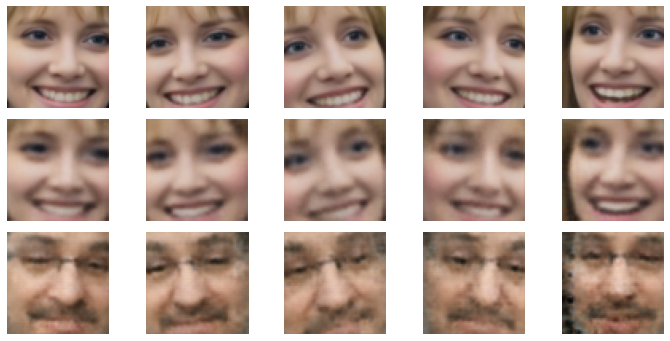

==============================B TO A==============================


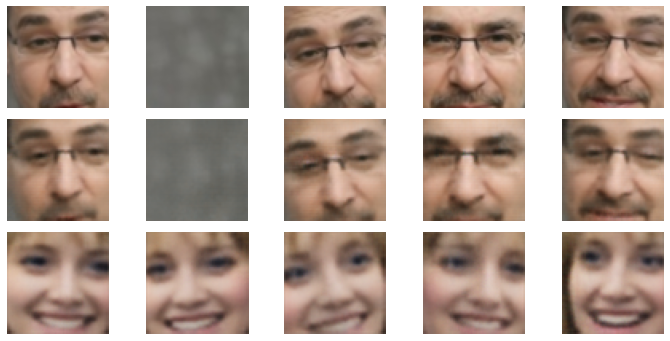

EPOCH: 401.000	lossA: 0.030	lossB: 0.021	(1515.05s - 2263.14s remaining)/r
EPOCH: 402.000	lossA: 0.030	lossB: 0.020	(1519.00s - 2259.61s remaining)/r
EPOCH: 403.000	lossA: 0.029	lossB: 0.020	(1522.91s - 2256.02s remaining)/r
EPOCH: 404.000	lossA: 0.030	lossB: 0.022	(1526.70s - 2252.27s remaining)/r
EPOCH: 405.000	lossA: 0.029	lossB: 0.022	(1530.52s - 2248.54s remaining)/r
EPOCH: 406.000	lossA: 0.030	lossB: 0.023	(1534.36s - 2244.85s remaining)/r
EPOCH: 407.000	lossA: 0.030	lossB: 0.021	(1538.19s - 2241.14s remaining)/r
EPOCH: 408.000	lossA: 0.030	lossB: 0.023	(1542.16s - 2237.64s remaining)/r
EPOCH: 409.000	lossA: 0.029	lossB: 0.021	(1546.01s - 2233.96s remaining)/r
EPOCH: 410.000	lossA: 0.029	lossB: 0.021	(1549.91s - 2230.36s remaining)/r
EPOCH: 411.000	lossA: 0.029	lossB: 0.021	(1553.77s - 2226.69s remaining)/r
EPOCH: 412.000	lossA: 0.029	lossB: 0.021	(1557.63s - 2223.02s remaining)/r
EPOCH: 413.000	lossA: 0.030	lossB: 0.023	(1561.47s - 2219.32s remaining)/r
EPOCH: 414.000	lossA: 0.0

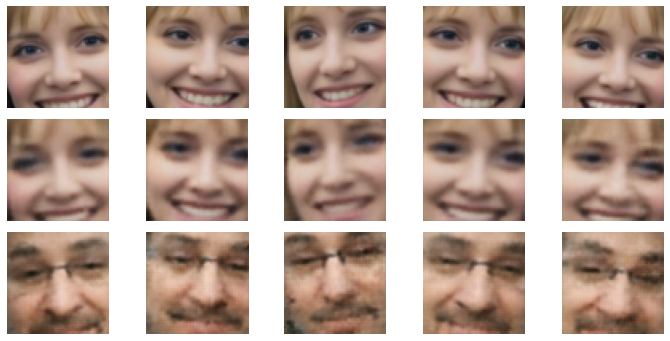

==============================B TO A==============================


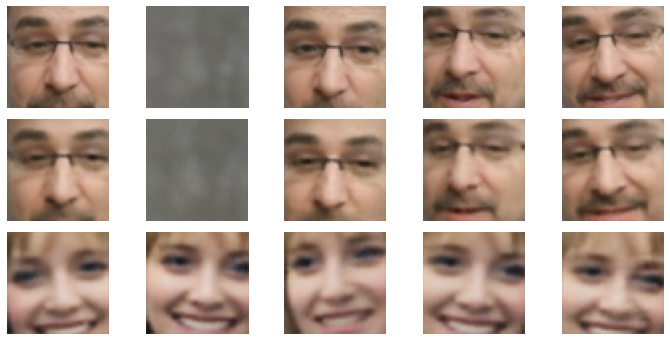

EPOCH: 451.000	lossA: 0.030	lossB: 0.022	(1705.74s - 2076.39s remaining)/r
EPOCH: 452.000	lossA: 0.028	lossB: 0.022	(1709.48s - 2072.56s remaining)/r
EPOCH: 453.000	lossA: 0.028	lossB: 0.021	(1713.21s - 2068.71s remaining)/r
EPOCH: 454.000	lossA: 0.030	lossB: 0.020	(1716.94s - 2064.86s remaining)/r
EPOCH: 455.000	lossA: 0.029	lossB: 0.020	(1720.65s - 2061.00s remaining)/r
EPOCH: 456.000	lossA: 0.030	lossB: 0.023	(1724.39s - 2057.17s remaining)/r
EPOCH: 457.000	lossA: 0.028	lossB: 0.021	(1728.13s - 2053.34s remaining)/r
EPOCH: 458.000	lossA: 0.028	lossB: 0.022	(1731.88s - 2049.52s remaining)/r
EPOCH: 459.000	lossA: 0.030	lossB: 0.022	(1735.61s - 2045.67s remaining)/r
EPOCH: 460.000	lossA: 0.028	lossB: 0.021	(1739.41s - 2041.91s remaining)/r
EPOCH: 461.000	lossA: 0.028	lossB: 0.020	(1743.23s - 2038.18s remaining)/r
EPOCH: 462.000	lossA: 0.028	lossB: 0.021	(1746.93s - 2034.30s remaining)/r
EPOCH: 463.000	lossA: 0.029	lossB: 0.021	(1750.64s - 2030.44s remaining)/r
EPOCH: 464.000	lossA: 0.0

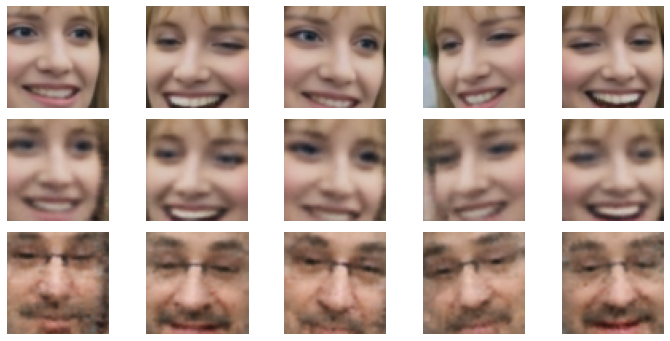

==============================B TO A==============================


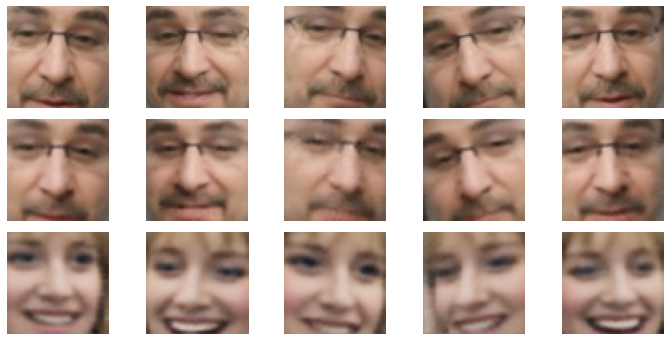

EPOCH: 501.000	lossA: 0.028	lossB: 0.021	(1895.36s - 1887.79s remaining)/r
EPOCH: 502.000	lossA: 0.028	lossB: 0.021	(1899.10s - 1883.97s remaining)/r
EPOCH: 503.000	lossA: 0.029	lossB: 0.021	(1902.84s - 1880.15s remaining)/r
EPOCH: 504.000	lossA: 0.028	lossB: 0.022	(1906.56s - 1876.30s remaining)/r
EPOCH: 505.000	lossA: 0.028	lossB: 0.021	(1910.31s - 1872.49s remaining)/r
EPOCH: 506.000	lossA: 0.027	lossB: 0.021	(1914.05s - 1868.66s remaining)/r
EPOCH: 507.000	lossA: 0.028	lossB: 0.021	(1917.78s - 1864.82s remaining)/r
EPOCH: 508.000	lossA: 0.028	lossB: 0.022	(1921.51s - 1860.99s remaining)/r
EPOCH: 509.000	lossA: 0.028	lossB: 0.021	(1925.22s - 1857.13s remaining)/r
EPOCH: 510.000	lossA: 0.027	lossB: 0.021	(1928.94s - 1853.30s remaining)/r
EPOCH: 511.000	lossA: 0.027	lossB: 0.021	(1932.68s - 1849.47s remaining)/r
EPOCH: 512.000	lossA: 0.029	lossB: 0.020	(1936.41s - 1845.65s remaining)/r
EPOCH: 513.000	lossA: 0.027	lossB: 0.022	(1940.15s - 1841.82s remaining)/r
EPOCH: 514.000	lossA: 0.0

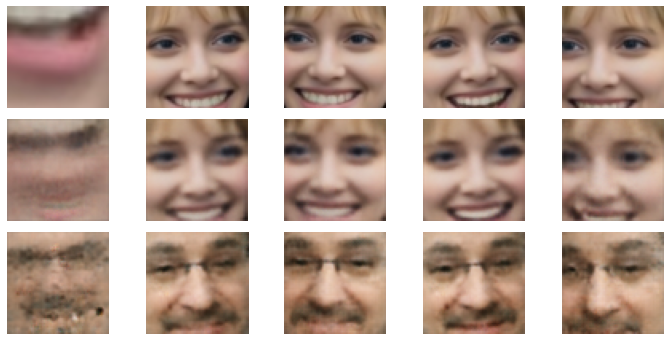

==============================B TO A==============================


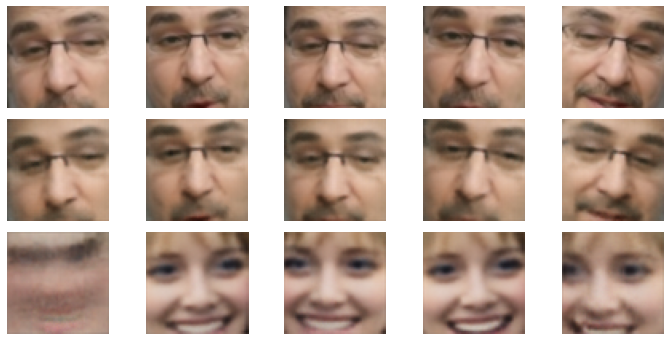

EPOCH: 551.000	lossA: 0.028	lossB: 0.020	(2083.97s - 1698.19s remaining)/r
EPOCH: 552.000	lossA: 0.026	lossB: 0.020	(2087.75s - 1694.41s remaining)/r
EPOCH: 553.000	lossA: 0.027	lossB: 0.020	(2091.55s - 1690.64s remaining)/r
EPOCH: 554.000	lossA: 0.027	lossB: 0.020	(2095.30s - 1686.83s remaining)/r
EPOCH: 555.000	lossA: 0.027	lossB: 0.021	(2099.02s - 1683.00s remaining)/r
EPOCH: 556.000	lossA: 0.027	lossB: 0.020	(2102.76s - 1679.18s remaining)/r
EPOCH: 557.000	lossA: 0.026	lossB: 0.021	(2106.50s - 1675.36s remaining)/r
EPOCH: 558.000	lossA: 0.027	lossB: 0.021	(2110.21s - 1671.53s remaining)/r
EPOCH: 559.000	lossA: 0.027	lossB: 0.021	(2113.94s - 1667.70s remaining)/r
EPOCH: 560.000	lossA: 0.028	lossB: 0.020	(2117.69s - 1663.90s remaining)/r
EPOCH: 561.000	lossA: 0.028	lossB: 0.021	(2121.45s - 1660.10s remaining)/r
EPOCH: 562.000	lossA: 0.027	lossB: 0.022	(2125.22s - 1656.31s remaining)/r
EPOCH: 563.000	lossA: 0.028	lossB: 0.021	(2128.95s - 1652.49s remaining)/r
EPOCH: 564.000	lossA: 0.0

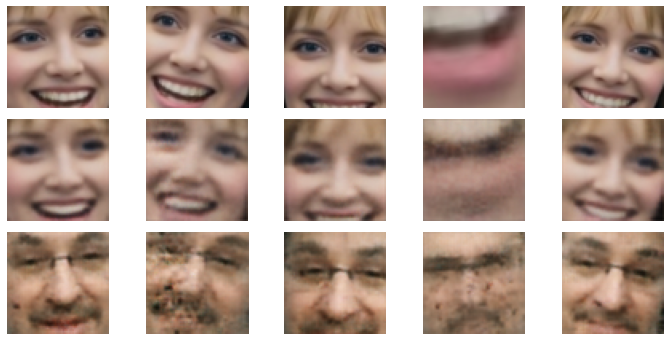

==============================B TO A==============================


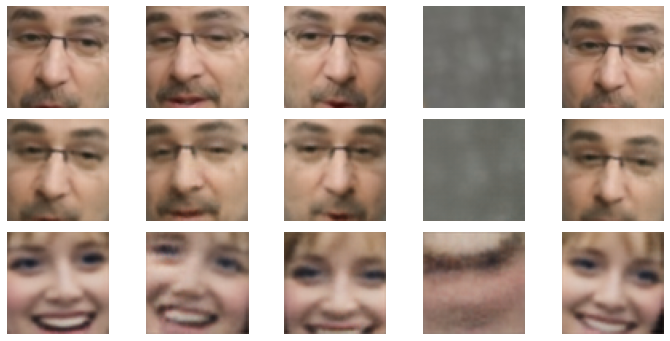

EPOCH: 601.000	lossA: 0.027	lossB: 0.020	(2273.26s - 1509.20s remaining)/r
EPOCH: 602.000	lossA: 0.026	lossB: 0.020	(2276.99s - 1505.39s remaining)/r
EPOCH: 603.000	lossA: 0.026	lossB: 0.020	(2280.74s - 1501.58s remaining)/r
EPOCH: 604.000	lossA: 0.027	lossB: 0.021	(2284.47s - 1497.77s remaining)/r
EPOCH: 605.000	lossA: 0.027	lossB: 0.019	(2288.18s - 1493.93s remaining)/r
EPOCH: 606.000	lossA: 0.026	lossB: 0.020	(2291.92s - 1490.13s remaining)/r
EPOCH: 607.000	lossA: 0.026	lossB: 0.020	(2295.64s - 1486.31s remaining)/r
EPOCH: 608.000	lossA: 0.026	lossB: 0.020	(2299.38s - 1482.50s remaining)/r
EPOCH: 609.000	lossA: 0.026	lossB: 0.021	(2303.11s - 1478.68s remaining)/r
EPOCH: 610.000	lossA: 0.027	lossB: 0.020	(2306.84s - 1474.86s remaining)/r
EPOCH: 611.000	lossA: 0.027	lossB: 0.021	(2310.59s - 1471.06s remaining)/r
EPOCH: 612.000	lossA: 0.027	lossB: 0.020	(2314.32s - 1467.25s remaining)/r
EPOCH: 613.000	lossA: 0.027	lossB: 0.021	(2318.07s - 1463.45s remaining)/r
EPOCH: 614.000	lossA: 0.0

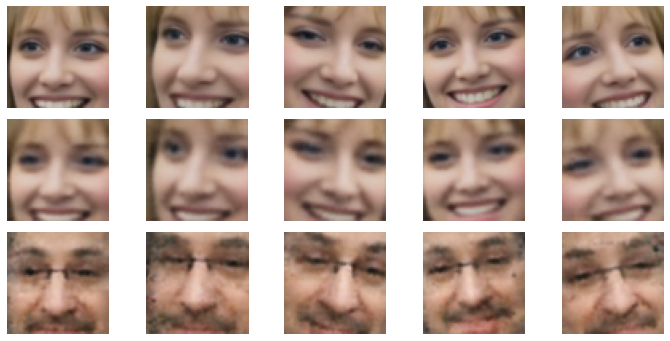

==============================B TO A==============================


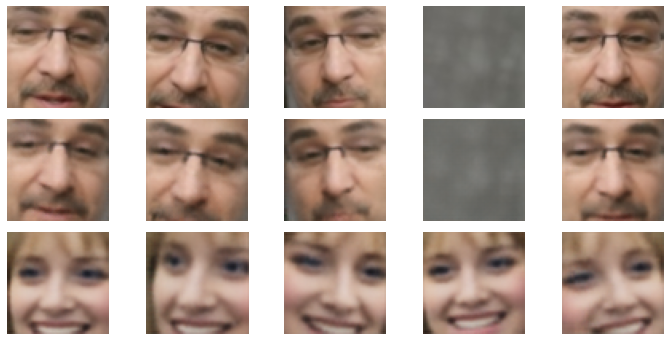

EPOCH: 651.000	lossA: 0.026	lossB: 0.020	(2462.84s - 1320.32s remaining)/r
EPOCH: 652.000	lossA: 0.027	lossB: 0.020	(2466.90s - 1316.69s remaining)/r
EPOCH: 653.000	lossA: 0.026	lossB: 0.019	(2470.79s - 1312.96s remaining)/r
EPOCH: 654.000	lossA: 0.026	lossB: 0.020	(2474.70s - 1309.25s remaining)/r
EPOCH: 655.000	lossA: 0.027	lossB: 0.020	(2478.62s - 1305.53s remaining)/r
EPOCH: 656.000	lossA: 0.025	lossB: 0.020	(2482.50s - 1301.80s remaining)/r
EPOCH: 657.000	lossA: 0.026	lossB: 0.019	(2486.38s - 1298.07s remaining)/r
EPOCH: 658.000	lossA: 0.028	lossB: 0.021	(2490.15s - 1294.27s remaining)/r
EPOCH: 659.000	lossA: 0.027	lossB: 0.020	(2493.93s - 1290.49s remaining)/r
EPOCH: 660.000	lossA: 0.026	lossB: 0.020	(2497.66s - 1286.68s remaining)/r
EPOCH: 661.000	lossA: 0.026	lossB: 0.019	(2501.44s - 1282.89s remaining)/r
EPOCH: 662.000	lossA: 0.026	lossB: 0.020	(2505.21s - 1279.09s remaining)/r
EPOCH: 663.000	lossA: 0.026	lossB: 0.020	(2509.05s - 1275.34s remaining)/r
EPOCH: 664.000	lossA: 0.0

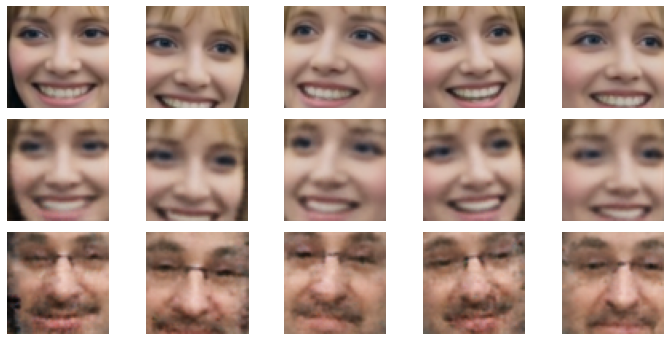

==============================B TO A==============================


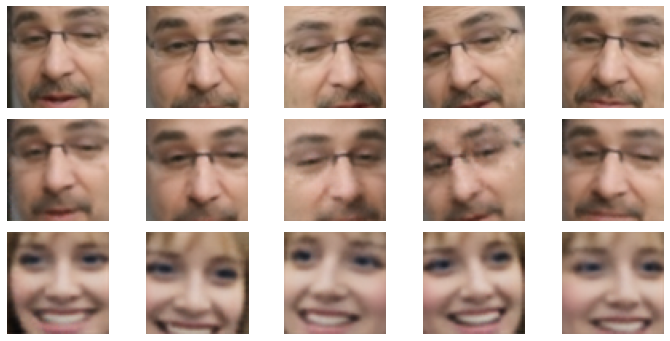

EPOCH: 701.000	lossA: 0.026	lossB: 0.020	(2655.15s - 1132.51s remaining)/r
EPOCH: 702.000	lossA: 0.026	lossB: 0.021	(2658.84s - 1128.68s remaining)/r
EPOCH: 703.000	lossA: 0.025	lossB: 0.019	(2662.51s - 1124.84s remaining)/r
EPOCH: 704.000	lossA: 0.027	lossB: 0.020	(2666.20s - 1121.02s remaining)/r
EPOCH: 705.000	lossA: 0.026	lossB: 0.018	(2669.92s - 1117.20s remaining)/r
EPOCH: 706.000	lossA: 0.026	lossB: 0.019	(2673.63s - 1113.38s remaining)/r
EPOCH: 707.000	lossA: 0.026	lossB: 0.020	(2677.35s - 1109.57s remaining)/r
EPOCH: 708.000	lossA: 0.026	lossB: 0.019	(2681.04s - 1105.74s remaining)/r
EPOCH: 709.000	lossA: 0.026	lossB: 0.019	(2684.76s - 1101.93s remaining)/r
EPOCH: 710.000	lossA: 0.025	lossB: 0.019	(2688.46s - 1098.10s remaining)/r
EPOCH: 711.000	lossA: 0.025	lossB: 0.018	(2692.19s - 1094.29s remaining)/r
EPOCH: 712.000	lossA: 0.025	lossB: 0.019	(2695.92s - 1090.48s remaining)/r
EPOCH: 713.000	lossA: 0.027	lossB: 0.020	(2699.61s - 1086.66s remaining)/r
EPOCH: 714.000	lossA: 0.0

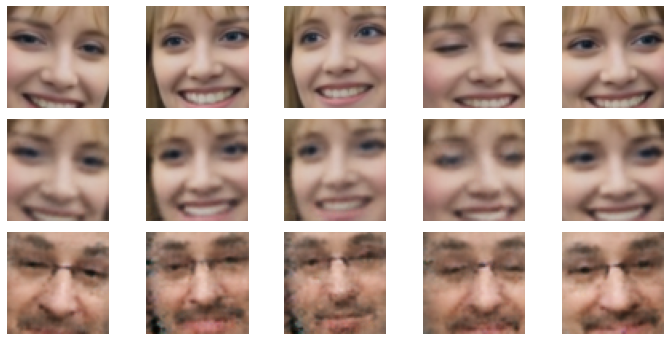

==============================B TO A==============================


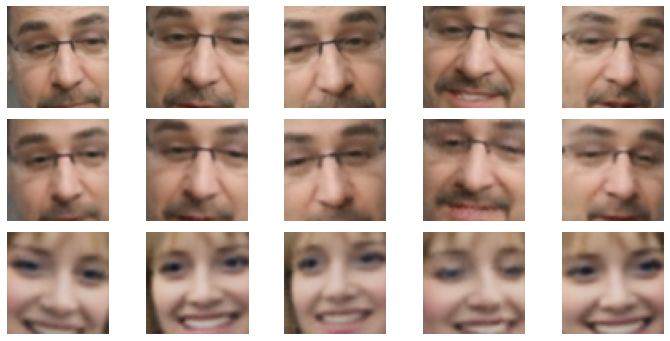

EPOCH: 751.000	lossA: 0.026	lossB: 0.019	(2843.02s - 942.63s remaining)/r
EPOCH: 752.000	lossA: 0.026	lossB: 0.019	(2846.73s - 938.81s remaining)/r
EPOCH: 753.000	lossA: 0.026	lossB: 0.018	(2850.42s - 935.00s remaining)/r
EPOCH: 754.000	lossA: 0.024	lossB: 0.020	(2854.13s - 931.19s remaining)/r
EPOCH: 755.000	lossA: 0.026	lossB: 0.019	(2857.89s - 927.39s remaining)/r
EPOCH: 756.000	lossA: 0.024	lossB: 0.019	(2861.57s - 923.58s remaining)/r
EPOCH: 757.000	lossA: 0.026	lossB: 0.019	(2865.32s - 919.78s remaining)/r
EPOCH: 758.000	lossA: 0.026	lossB: 0.019	(2869.03s - 915.97s remaining)/r
EPOCH: 759.000	lossA: 0.025	lossB: 0.019	(2872.76s - 912.17s remaining)/r
EPOCH: 760.000	lossA: 0.025	lossB: 0.019	(2876.48s - 908.36s remaining)/r
EPOCH: 761.000	lossA: 0.025	lossB: 0.019	(2880.18s - 904.55s remaining)/r
EPOCH: 762.000	lossA: 0.026	lossB: 0.019	(2883.90s - 900.75s remaining)/r
EPOCH: 763.000	lossA: 0.025	lossB: 0.017	(2887.58s - 896.93s remaining)/r
EPOCH: 764.000	lossA: 0.025	lossB: 0.0

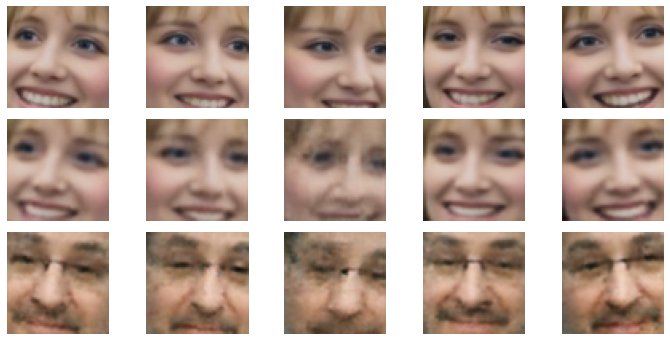

==============================B TO A==============================


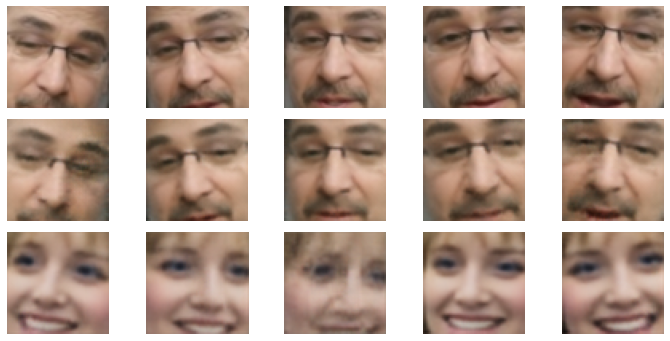

EPOCH: 801.000	lossA: 0.025	lossB: 0.019	(3031.96s - 753.26s remaining)/r
EPOCH: 802.000	lossA: 0.024	lossB: 0.019	(3035.65s - 749.45s remaining)/r
EPOCH: 803.000	lossA: 0.026	lossB: 0.019	(3039.39s - 745.65s remaining)/r
EPOCH: 804.000	lossA: 0.025	lossB: 0.019	(3043.08s - 741.85s remaining)/r
EPOCH: 805.000	lossA: 0.025	lossB: 0.019	(3046.78s - 738.04s remaining)/r
EPOCH: 806.000	lossA: 0.025	lossB: 0.018	(3050.48s - 734.23s remaining)/r
EPOCH: 807.000	lossA: 0.024	lossB: 0.018	(3054.19s - 730.43s remaining)/r
EPOCH: 808.000	lossA: 0.025	lossB: 0.018	(3057.89s - 726.63s remaining)/r
EPOCH: 809.000	lossA: 0.025	lossB: 0.018	(3061.59s - 722.82s remaining)/r
EPOCH: 810.000	lossA: 0.026	lossB: 0.019	(3065.32s - 719.02s remaining)/r
EPOCH: 811.000	lossA: 0.025	lossB: 0.020	(3069.04s - 715.23s remaining)/r
EPOCH: 812.000	lossA: 0.025	lossB: 0.019	(3072.73s - 711.42s remaining)/r
EPOCH: 813.000	lossA: 0.025	lossB: 0.018	(3076.51s - 707.64s remaining)/r
EPOCH: 814.000	lossA: 0.025	lossB: 0.0

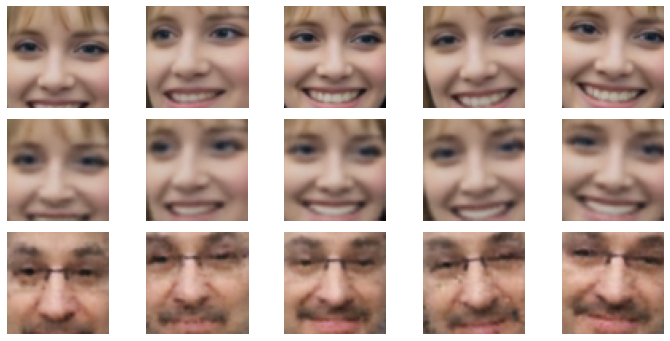

==============================B TO A==============================


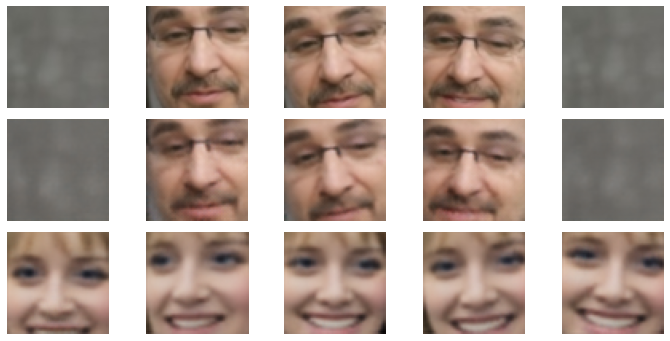

EPOCH: 851.000	lossA: 0.024	lossB: 0.017	(3220.56s - 563.88s remaining)/r
EPOCH: 852.000	lossA: 0.025	lossB: 0.017	(3224.28s - 560.09s remaining)/r
EPOCH: 853.000	lossA: 0.025	lossB: 0.019	(3228.01s - 556.29s remaining)/r
EPOCH: 854.000	lossA: 0.026	lossB: 0.019	(3231.79s - 552.51s remaining)/r
EPOCH: 855.000	lossA: 0.025	lossB: 0.019	(3235.57s - 548.72s remaining)/r
EPOCH: 856.000	lossA: 0.025	lossB: 0.020	(3239.31s - 544.93s remaining)/r
EPOCH: 857.000	lossA: 0.025	lossB: 0.019	(3243.07s - 541.14s remaining)/r
EPOCH: 858.000	lossA: 0.024	lossB: 0.018	(3246.83s - 537.35s remaining)/r
EPOCH: 859.000	lossA: 0.025	lossB: 0.019	(3250.56s - 533.56s remaining)/r
EPOCH: 860.000	lossA: 0.025	lossB: 0.018	(3254.31s - 529.77s remaining)/r
EPOCH: 861.000	lossA: 0.025	lossB: 0.019	(3258.04s - 525.98s remaining)/r
EPOCH: 862.000	lossA: 0.025	lossB: 0.018	(3261.79s - 522.19s remaining)/r
EPOCH: 863.000	lossA: 0.025	lossB: 0.019	(3265.52s - 518.40s remaining)/r
EPOCH: 864.000	lossA: 0.025	lossB: 0.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


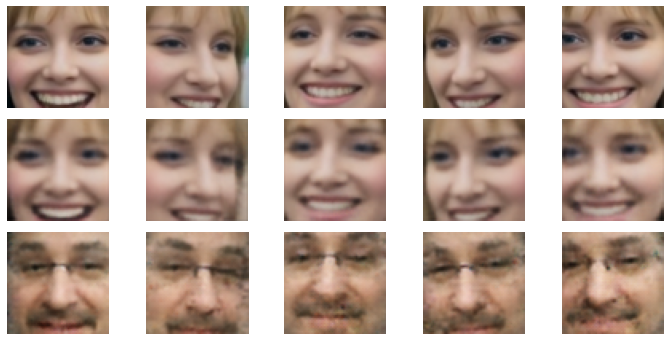

==============================B TO A==============================


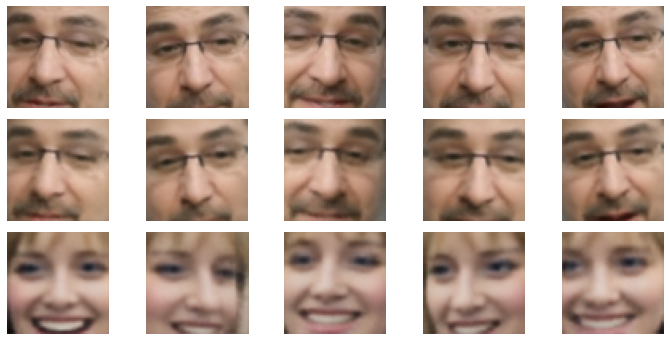

EPOCH: 901.000	lossA: 0.024	lossB: 0.018	(3409.91s - 374.67s remaining)/r
EPOCH: 902.000	lossA: 0.024	lossB: 0.018	(3413.63s - 370.88s remaining)/r
EPOCH: 903.000	lossA: 0.024	lossB: 0.018	(3417.40s - 367.10s remaining)/r
EPOCH: 904.000	lossA: 0.024	lossB: 0.018	(3421.12s - 363.30s remaining)/r
EPOCH: 905.000	lossA: 0.024	lossB: 0.018	(3424.82s - 359.51s remaining)/r
EPOCH: 906.000	lossA: 0.024	lossB: 0.019	(3428.53s - 355.72s remaining)/r
EPOCH: 907.000	lossA: 0.024	lossB: 0.019	(3432.26s - 351.93s remaining)/r
EPOCH: 908.000	lossA: 0.025	lossB: 0.020	(3435.99s - 348.14s remaining)/r
EPOCH: 909.000	lossA: 0.025	lossB: 0.018	(3439.71s - 344.35s remaining)/r
EPOCH: 910.000	lossA: 0.024	lossB: 0.018	(3443.48s - 340.56s remaining)/r
EPOCH: 911.000	lossA: 0.024	lossB: 0.018	(3447.19s - 336.77s remaining)/r
EPOCH: 912.000	lossA: 0.023	lossB: 0.018	(3450.95s - 332.99s remaining)/r
EPOCH: 913.000	lossA: 0.024	lossB: 0.018	(3454.63s - 329.19s remaining)/r
EPOCH: 914.000	lossA: 0.025	lossB: 0.0

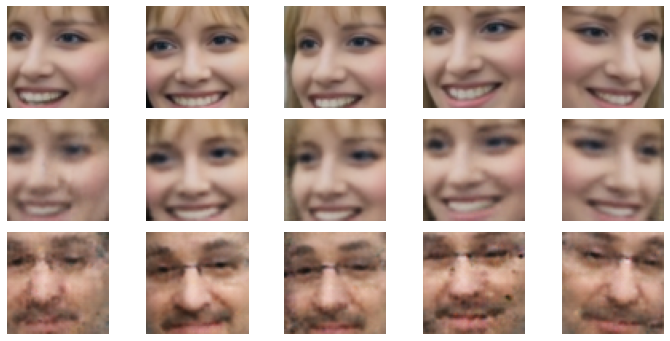

==============================B TO A==============================


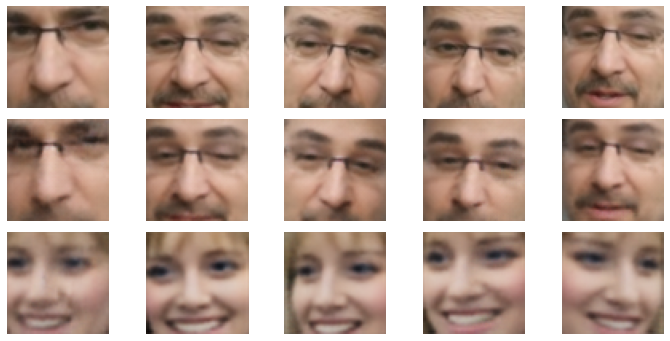

EPOCH: 951.000	lossA: 0.026	lossB: 0.018	(3598.70s - 185.42s remaining)/r
EPOCH: 952.000	lossA: 0.025	lossB: 0.018	(3602.41s - 181.63s remaining)/r
EPOCH: 953.000	lossA: 0.025	lossB: 0.018	(3606.14s - 177.85s remaining)/r
EPOCH: 954.000	lossA: 0.024	lossB: 0.018	(3609.89s - 174.06s remaining)/r
EPOCH: 955.000	lossA: 0.023	lossB: 0.017	(3613.62s - 170.28s remaining)/r
EPOCH: 956.000	lossA: 0.024	lossB: 0.019	(3617.33s - 166.49s remaining)/r
EPOCH: 957.000	lossA: 0.024	lossB: 0.018	(3621.05s - 162.70s remaining)/r
EPOCH: 958.000	lossA: 0.024	lossB: 0.018	(3624.80s - 158.92s remaining)/r
EPOCH: 959.000	lossA: 0.024	lossB: 0.019	(3628.54s - 155.13s remaining)/r
EPOCH: 960.000	lossA: 0.024	lossB: 0.019	(3632.27s - 151.34s remaining)/r
EPOCH: 961.000	lossA: 0.024	lossB: 0.018	(3636.01s - 147.56s remaining)/r
EPOCH: 962.000	lossA: 0.025	lossB: 0.018	(3639.73s - 143.77s remaining)/r
EPOCH: 963.000	lossA: 0.024	lossB: 0.017	(3643.47s - 139.99s remaining)/r
EPOCH: 964.000	lossA: 0.025	lossB: 0.0

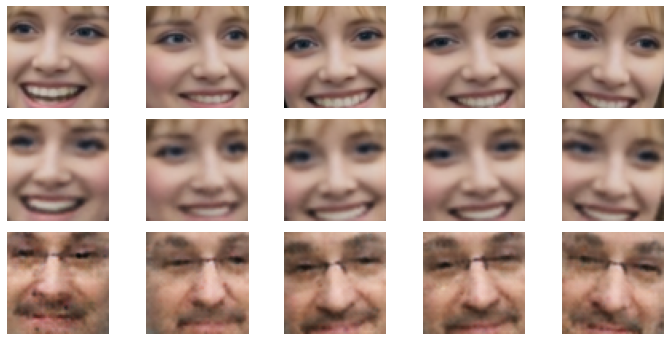

==============================B TO A==============================


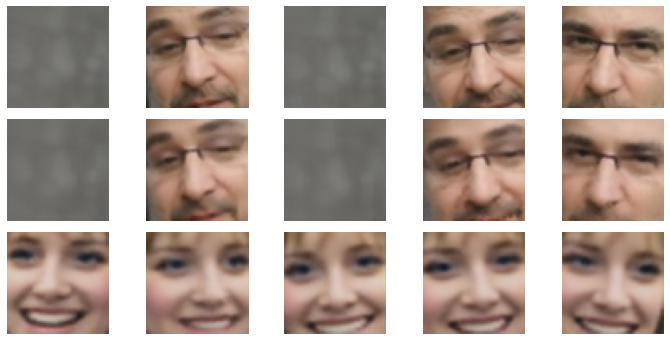

100%|██████████| 1101/1101 [00:00<00:00, 1254.06it/s]


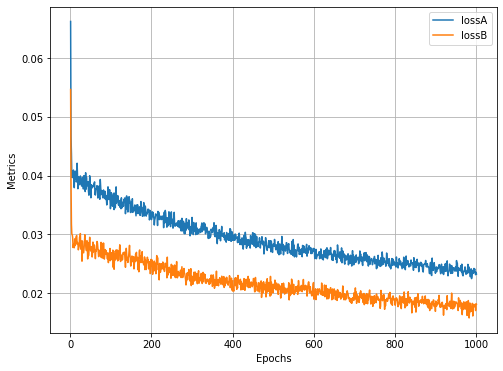

In [27]:
train_model(model)

From this, we can see that we can leverage GANs to generate images that are realistic,
but still with some scope for improvement. In the next section, we will learn about
using deep convolutional GANs to generate more realistic images.